# Assignment 1: 

**Student:** Astride Melvin Fokam Ninyim

**Course:** XAI

### Import the requirements libraries and modules

In [170]:
# Standard Library
import os
import sys
import random
import ast
import math

# Data Processing
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn - Datasets
import sklearn.datasets as datasets
from sklearn.datasets import load_diabetes, load_breast_cancer

# Scikit-learn - Model Selection & Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Scikit-learn - Metrics & Trees
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree

# Scikit-learn - Linear Models
from sklearn.linear_model import LogisticRegression

# XGBoost
import xgboost
from xgboost import XGBClassifier, XGBRegressor

# Deep Learning (PyTorch)
import torch
from torch import optim, nn
import torch.nn.functional as F
import torchvision
from torchvision import models, transforms, datasets as torch_datasets

# Explainability
import shap
from lime import lime_image

# Other Libraries
import optuna
import dcor  # pip install dcor
from skimage.segmentation import mark_boundaries
from PIL import Image
from itertools import combinations

# Custom modules
sys.path.append(os.path.abspath(os.path.join('..')))
from Counterfactuals.utils import (
    encode_features, 
    get_train_test_data, 
    train_model, 
    evaluate_model, 
    generate_individual, 
    epsilon_rounding, 
    get_relevant_candidates
)

# Configuration
optuna.logging.set_verbosity(optuna.logging.WARNING)
shap.initjs()  # Comment out if this doesn't work

# Homework 1: Global Surrogate Models

**Topic:** Explainable AI - Interpreting Black-Box models via Surrogates.

# Definitions

## 1. Terminology
*   **Explanation:** A method that explains the decision process or outputs of an AI system to increase human understanding.
*   **Local vs. Global:** A global explanation describes the behavior of the entire model, while a local explanation focuses on a single data point.
*   **Model-Agnostic vs. Specific:** Agnostic methods work on any model (like surrogates), while specific methods depend on the internal structure (like weights in a NN).

## 2-Practical 

### a-  Setting seed for reproducibility 

In [172]:

np.random.seed(42)

### b-Load the California housing dataset

In [173]:
california = datasets.fetch_california_housing()
X = pd.DataFrame(california.data, columns=california.feature_names)
y = pd.Series(california.target, name='MedHouseVal')

### c-EDA of the Dataset

In [174]:
#print the first five rows of the dataset
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [175]:
# print the first five labels of the dataset
y.head()

0    4.526
1    3.585
2    3.521
3    3.413
4    3.422
Name: MedHouseVal, dtype: float64

In [176]:
# describe the dataset
X.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000


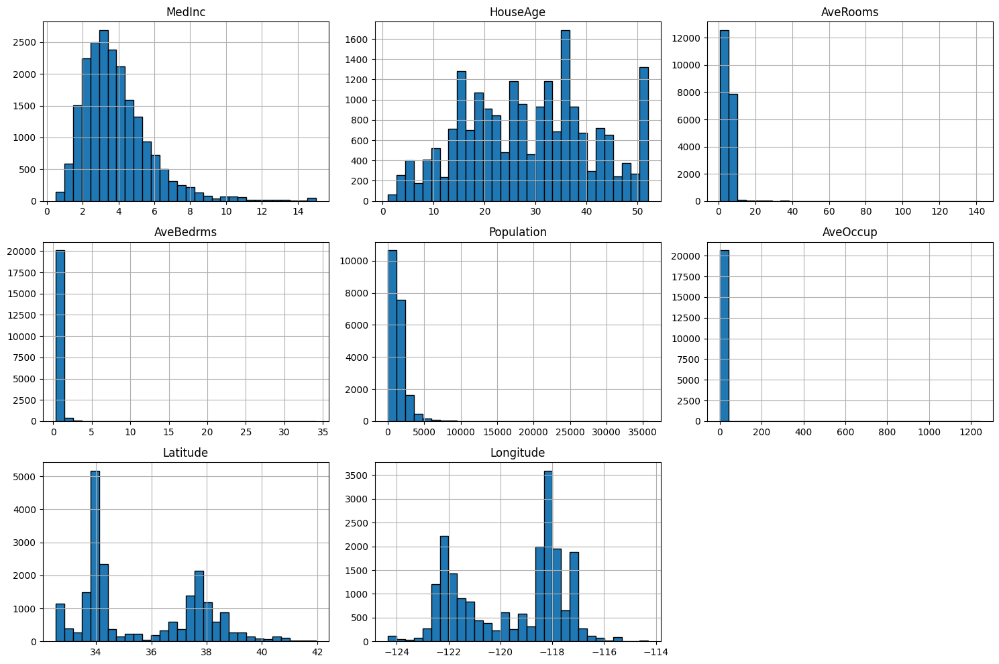

In [180]:
# Histograms for all features
X.hist(figsize=(15, 10), bins=30, edgecolor='black')
plt.tight_layout()
plt.show()


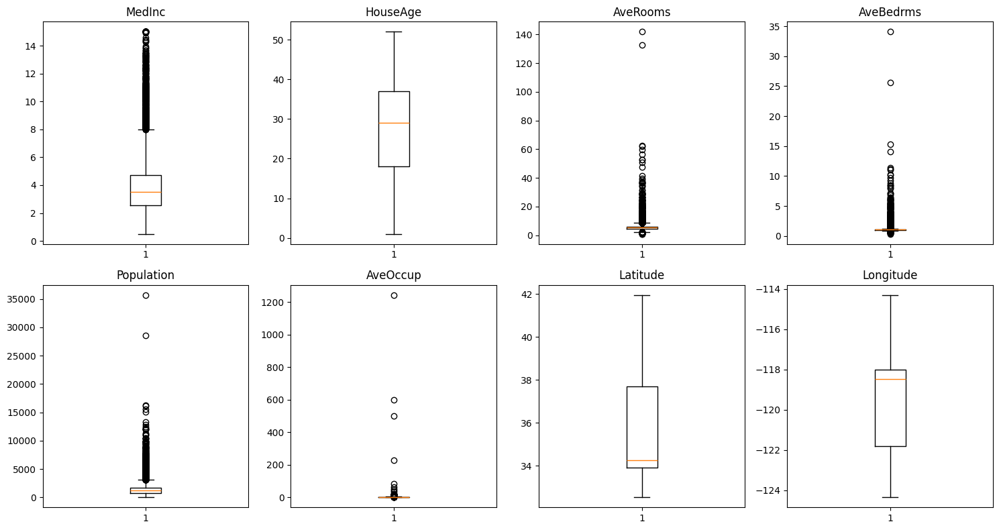

In [181]:
# Box plots to detect outliers
fig, axes = plt.subplots(2, 4, figsize=(15, 8))
for idx, col in enumerate(X.columns):
    ax = axes[idx // 4, idx % 4]
    ax.boxplot(X[col].dropna())
    ax.set_title(col)
plt.tight_layout()
plt.show()

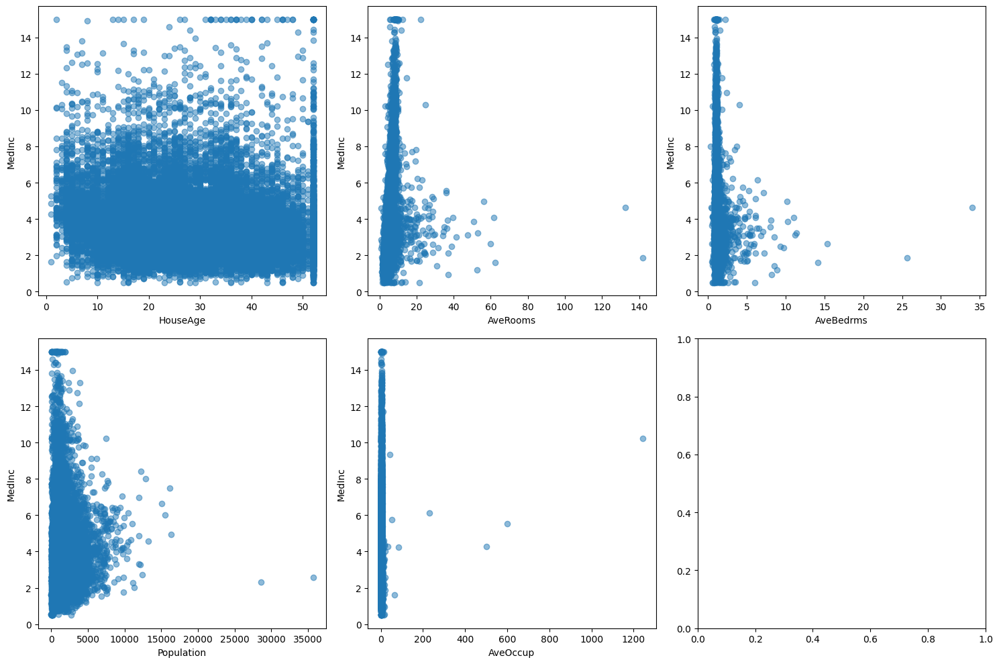

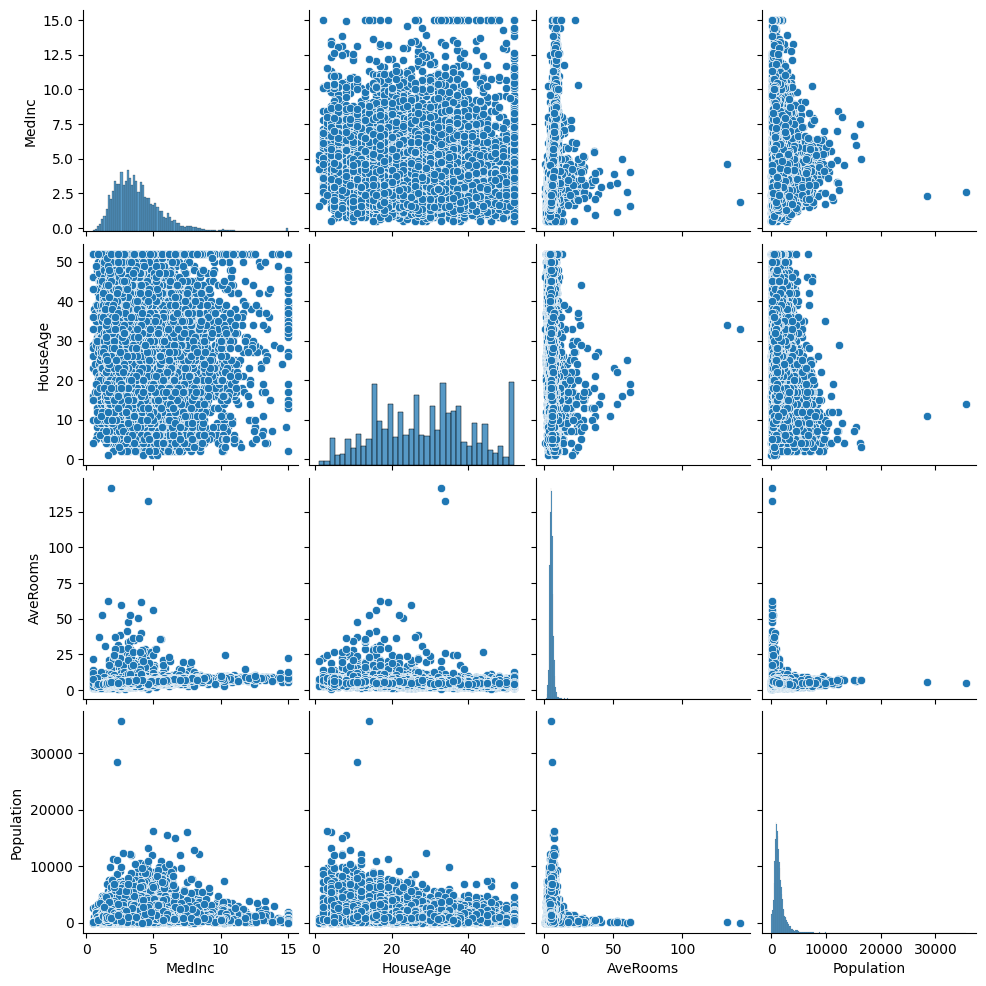

In [182]:
# Scatter plots - MedInc vs other features
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
features = ['HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']
for idx, feature in enumerate(features):
    ax = axes[idx // 3, idx % 3]
    ax.scatter(X[feature], X['MedInc'], alpha=0.5)
    ax.set_xlabel(feature)
    ax.set_ylabel('MedInc')
plt.tight_layout()
plt.show()

# Pairplot for key features
sns.pairplot(X[['MedInc', 'HouseAge', 'AveRooms', 'Population']])
plt.show()

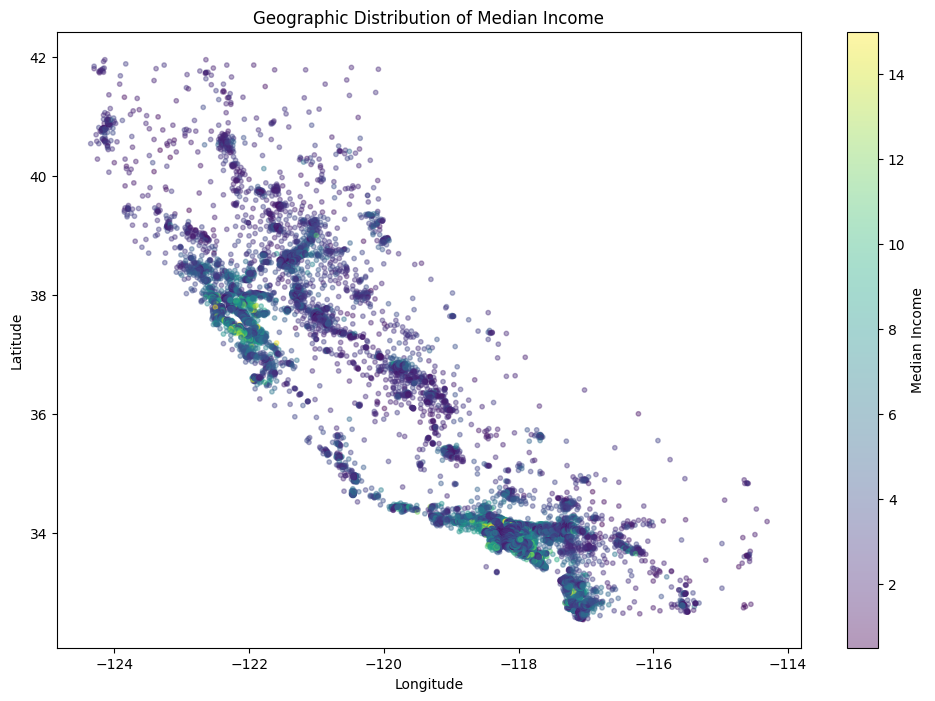

In [183]:
# Scatter plot based on location
plt.figure(figsize=(12, 8))
scatter = plt.scatter(X['Longitude'], X['Latitude'], 
                     c=X['MedInc'], cmap='viridis', 
                     alpha=0.4, s=10)
plt.colorbar(scatter, label='Median Income')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographic Distribution of Median Income')
plt.show()

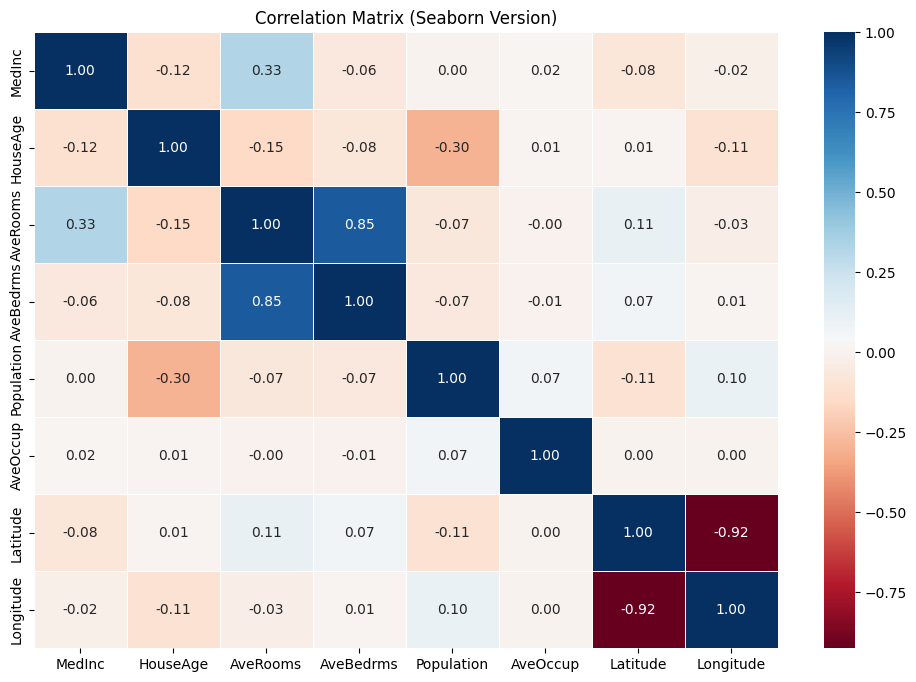

In [184]:
# Visualize the correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(X.corr(), annot=True, cmap='RdBu', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix (Seaborn Version)')
plt.show()

### **NOTE:** we don't need to standarize the data for tree-based models like XGBoost because they are not sensitive to the scale of the features.

### d-create the train and test sets

In [185]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### e-train an xgboost regressor

In [186]:
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)

,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'reg:squarederror'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,None
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes

### f-get the predictions

In [187]:
y_pred = xgb_model.predict(X_train)

### g-train the surrogate model now with the decision tree regressor and the predictions from the xgboost model

In [188]:
surrogate_model = DecisionTreeRegressor(max_depth=4, random_state=42)
surrogate_model.fit(X_train, y_pred)

,"criterion criterion: {""squared_error"", ""friedman_mse"", ""absolute_error"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in the half mean Poisson deviance to find splits... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 0.24 Poisson deviance criterion.",'squared_error'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.For an example of how ``max_depth`` influences the model, see:ref:`sphx_glr_auto_examples_tree_plot_tree_regression.py`.",4
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",None
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary ` for details.",42
,"max_leaf

### h-make a global explanation by visualizing the decision tree

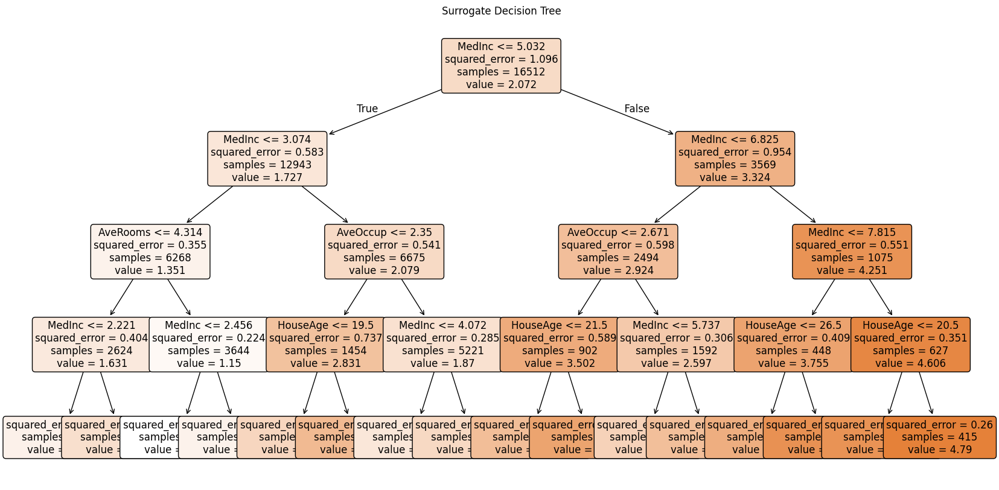

In [189]:
plt.figure(figsize=(20,10))
plot_tree(surrogate_model, feature_names=X.columns, filled=True, rounded=True, fontsize=12)
plt.title('Surrogate Decision Tree')
plt.show()

/tmp/ipykernel_12256/1837951833.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Features', data=df_importances, palette='viridis')


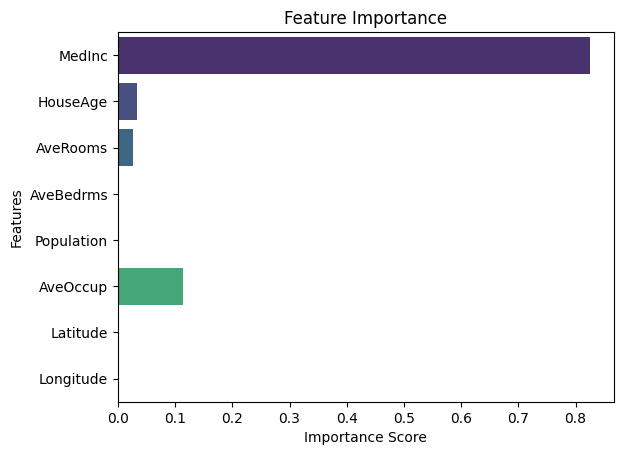

In [190]:
# Feature Importance
importances = pd.Series(surrogate_model.feature_importances_, index=X.columns)
df_importances = importances.reset_index()
df_importances.columns = ['Features', 'Importance']
sns.barplot(x='Importance', y='Features', data=df_importances, palette='viridis')
plt.title("Feature Importance")
plt.xlabel("Importance Score")
plt.show()

### i-make a local explanation for a specific instance

In [191]:
# make the prediction and print now the results
instance_index = 0  
instance = X_test.iloc[[instance_index]]
predicted_value = xgb_model.predict(instance)
surrogate_prediction = surrogate_model.predict(instance)

print(f"Instance to explain (index {instance_index}):")
print(instance)
print(f"\nXGBoost Model Prediction: {predicted_value[0]}")
print(f"Surrogate Model Prediction: {surrogate_prediction[0]}")

Instance to explain (index 0):
       MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
20046  1.6812      25.0  4.192201   1.022284      1392.0  3.877437     36.06   

       Longitude  
20046    -119.01  

XGBoost Model Prediction: 0.4833424687385559
Surrogate Model Prediction: 1.3755852161992526


In [193]:
#explaination  of  why the surrogate model made that prediction by visualizing the decision path 
node_indicator = surrogate_model.decision_path(instance)
leaf_id = surrogate_model.apply(instance)
feature = surrogate_model.tree_.feature
threshold = surrogate_model.tree_.threshold

print("\nDecision path:")
node_index = node_indicator.indices[node_indicator.indptr[0]:node_indicator.indptr[1]]      
for node_id in node_index:
    if leaf_id[0] == node_id:
        print(f"Leaf node {node_id} reached.")
        print(f"Predicted value is: {surrogate_prediction[0]}")
        continue

    if instance.iloc[0, feature[node_id]] <= threshold[node_id]:
        threshold_sign = "<="
    else:
        threshold_sign = ">"

    print(f"Node {node_id}: (feature '{X.columns[feature[node_id]]}' = {instance.iloc[0, feature[node_id]]}) "
          f"{threshold_sign} {threshold[node_id]}") 


Decision path:
Node 0: (feature 'MedInc' = 1.6812) <= 5.031649827957153
Node 1: (feature 'MedInc' = 1.6812) <= 3.074299931526184
Node 2: (feature 'AveRooms' = 4.192200557103064) <= 4.3141889572143555
Node 3: (feature 'MedInc' = 1.6812) <= 2.2213000059127808
Leaf node 4 reached.
Predicted value is: 1.3755852161992526


In [194]:
#check the value at the leaf node
leaf_value = surrogate_model.tree_.value[leaf_id[0]]
print(f"\nValue at leaf node {leaf_id[0]}: {leaf_value[0][0]}")


Value at leaf node 4: 1.3755852161992526


# Homework 2:

### a-Data

In [219]:
def load_data(data_filepath="../data/Loan_data_extracted.csv"):
    """
    Input: path to .csv data file

    TODO: specify in feature_info whether features are of type:
        fixed, meaning cannot change for the counterfactual
        unique, meaning can only take existing categorical values
        increase, meaning their value can only increase and not decrease
        range, meaning their new value can take a range of values

    Returns:
        dataframe and feature configuration dictionary
    """
    df = pd.read_csv(data_filepath)
    df = df.drop('Loan_ID', axis=1)
    df = df.dropna()

    feature_config = {
        "categorical": ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Loan_Status"],


        "feature_info": [
            ('Gender', 'fixed'),
            ('Married', 'unique'),
            ('Dependents', 'fixed'),
            ('Education', 'increase'),
            ('Self_Employed', 'unique'),
            ('ApplicantIncome', 'range'),
            ('CoapplicantIncome', 'range'),
            ('LoanAmount', 'fixed'),
            ('Loan_Amount_Term', 'unique'),
            ('Credit_History', 'unique'),
            ('Property_Area', 'unique'),
        ],

        "categorical_features": ["Gender", "Married", "Education", "Self_Employed", "Property_Area"]
    }

    return df, feature_config

### b- Model

In [220]:
# Load the model from the saved file
model = xgboost.XGBClassifier()
model.load_model("../Counterfactuals/xgboost_model.json")

### c-Code for counterfactual search

In [221]:
def misfit(x_prime, y_target, model):
    """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """
    y_prime_prediction = model.predict_proba(x_prime)[:,1]
     
    

    return np.abs(y_target-y_prime_prediction).sum()

In [222]:
def misfit_wachter(x_prime, y_target, model, alpha = 0.8):
  """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """
  y_prime_prediction = model.predict_proba(x_prime)[:,1]
  

  return alpha*np.abs((y_target-y_prime_prediction)**2).sum()

In [223]:
def distance(X, x, x_prime, numerical, categorical):
    """
    Optimisation criterion 2
    Calculate distance between x_prime and x.
    """
    # Normalize data
    scaler = MinMaxScaler()
    scaler.fit(X[numerical])
    x_normalized = scaler.transform(x[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute distances
    #numerical distance: L1 norm
    num_distance = np.abs(x_normalized - x_prime_normalized).sum()
    
    #categorical distance: simple matching
    cat_distance = (x[categorical]!=x_prime[categorical]).sum().sum()
    p = len(numerical)+len(categorical)

    return (num_distance+cat_distance)/p

In [224]:
def sparsity(x, x_prime):
    """
    Optimisation criterion 3
    Return number of unchanged????? features.
    """
    
    unchanged_features = (x == x_prime).sum().sum()

    return unchanged_features

In [225]:
def closest_real(X, x_prime, categorical, numerical):
    """
    Optimisation criterion 4
    Return the minimum distance between x_prime and any point in X.
    """
    scaler = MinMaxScaler()


    x_normalized = scaler.fit_transform(X[numerical])

    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute total distance
    #TODO

    numerical_distances = np.sum(np.abs(x_normalized - x_prime_normalized), axis=1)

    # Prepare x_prime's categorical part as a Series for direct comparison
    x_prime_categorical_series = x_prime[categorical].iloc[0]

    # Compute categorical distances for each row in X[categorical]
    # 'apply' with axis=1 makes 'row_series' a Series representing a row from X[categorical]
    categorical_distances = X[categorical].apply(lambda row_series: (row_series != x_prime_categorical_series).sum(), axis=1)

    # Compute total distance (normalized by the total number of features)
    p = len(numerical) + len(categorical)
    total_distances = (numerical_distances + categorical_distances) / p

    min_dist = np.min(total_distances)

    return min_dist

In [226]:
def objective(trial, X, x, features, model, y_target, numerical, categorical):
    x_prime = x.copy()
    for feature in features:
        feature.sample(trial)
        x_prime[feature.name] = feature.value
    epsilon_rounding(x, x_prime, 1e-1)

    obj1 = misfit(x_prime, y_target, model)
    obj2 = distance(X, x, x_prime, numerical, categorical)
    obj3 = sparsity(x, x_prime)
    obj4 = closest_real(X, x_prime, categorical, numerical)

    return obj1, obj2, obj3, obj4

In [227]:
def get_counterfactuals(X, x, y_target, model,
                        numerical, categorical, features,
                        tol, optimization_steps, timeout):

    study = optuna.create_study(directions=['minimize', 'minimize', 'maximize', 'minimize'],
                                sampler=optuna.samplers.NSGAIISampler(seed=42))

    study.optimize(lambda trial: objective(trial, X, x, features, model,
                                           y_target,
                                           numerical,
                                           categorical),
                   n_trials=optimization_steps,
                   timeout=timeout)

    candidates_df = get_relevant_candidates(study, x, model, y_target, tol)

    return candidates_df

## Provided datapoint and data

In [228]:
X_obs, feat_conf = load_data("../data/Loan_data_extracted.csv")
X_obs = encode_features(X_obs, feat_conf["categorical"])
df=X_obs.copy()

--- 
Encoded categorical features as follows:
Gender :  {'Female': 0, 'Male': 1}
Married :  {'No': 0, 'Yes': 1}
Education :  {'Not Graduate': 0, 'Graduate': 1}
Self_Employed :  {'No': 0, 'Yes': 1}
Property_Area :  {'Rural': 0, 'Semiurban': 1, 'Urban': 2}
Loan_Status :  {'N': 0, 'Y': 1}
---


In [229]:
customer = np.array([0,1,0,0,0,2000,1500,1000,480,0,1])
x = pd.DataFrame([customer], columns=X_obs.columns[:-1].tolist())

In [230]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [231]:
# Check that our customer x did not get the loan

# TODO
prediction = model.predict(x)[0]
print(f"the customer {"did not get" if prediction==0 else "got"} the loan")
# and help her find out what she has to do in order to get the loan
# If you have implemented everything above correctly, the code below
# will find the counterfactuals

the customer did not get the loan


## Search for counterfactuals

In [232]:
x_cf = x.copy()
x_cf["Credit_History"]= 1
x_cf["Loan_Amount_Term"]=200
print(model.predict(x_cf))

[1]


In [233]:
n_iterations = 500
y_cf = 0.7 # Desired probability for the positive class (Loan_Status = 1)

min_total_cost = float('inf')
best_cf_found = None


# Pre-extract feature information for efficient access
feature_definitions = {name: ftype for name, ftype in feat_conf["feature_info"]}

for _ in range(n_iterations):
    x_cf_candidate = x.copy() # Start with a copy of the original instance

    for col in x.columns:
        ftype = feature_definitions.get(col)

        if ftype == 'fixed':
            # Fixed features remain unchanged. Already handled by x_cf_candidate = x.copy().
            pass
        elif ftype == 'unique':
            # For unique (categorical) features, pick a random value from observed unique values.
            # Make sure to handle potential NaN values by dropping them before getting unique values.
            unique_vals = X_obs[col].dropna().unique()
            if len(unique_vals) > 0:
                x_cf_candidate[col] = np.random.choice(unique_vals)
            else:
                # If no unique values observed, keep original.
                x_cf_candidate[col] = x[col].iloc[0]

        elif ftype == 'increase':
            # For 'increase' numerical features, pick a random value >= original and <= max observed.
            original_val = x[col].iloc[0]
            max_val = X_obs[col].max()
            if original_val < max_val:
                x_cf_candidate[col] = np.random.uniform(original_val, max_val)
            else:
                x_cf_candidate[col] = original_val # If already at max, cannot increase further.

        elif ftype == 'range':
            # For 'range' numerical features, pick a random value within the observed min/max.
            min_val = X_obs[col].min()
            max_val = X_obs[col].max()
            if not pd.isna(min_val) and not pd.isna(max_val): # Ensure min/max are valid
                x_cf_candidate[col] = np.random.uniform(min_val, max_val)
            else:
                x_cf_candidate[col] = x[col].iloc[0] # Fallback to original if range is undefined

    # Apply epsilon rounding to numerical features to make them more "real-world"
    # epsilon_rounding expects DataFrames for both x and x_prime.
    epsilon_rounding(x, x_cf_candidate, 1e-1)

    # Ensure categorical features are integers after any numerical operations (like rounding)
    for cat_col in feat_conf["categorical_features"]:
        if cat_col in x_cf_candidate.columns:
            x_cf_candidate[cat_col] = x_cf_candidate[cat_col].round().astype(int)
            # Ensure the value is within the range of observed encoded categories
            unique_observed_values = X_obs[cat_col].dropna().unique()
            if len(unique_observed_values) > 0:
                x_cf_candidate[cat_col] = np.clip(x_cf_candidate[cat_col], unique_observed_values.min(), unique_observed_values.max())


    # Calculate the Wachter-like combined objective
    # y_cf (0.7) is the target probability for class 1 (loan granted)
    obj1_misfit = misfit_wachter(x_cf_candidate, y_cf, model, alpha=10)
    obj2_distance = distance(X_obs, x, x_cf_candidate, numerical_features, feat_conf["categorical_features"])

    total_cost = obj1_misfit + obj2_distance

    if total_cost < min_total_cost:
        min_total_cost = total_cost
        best_cf_found = x_cf_candidate.copy()

print(f"Manual search for Wachter-like counterfactuals (after {n_iterations} iterations):")


Manual search for Wachter-like counterfactuals (after 500 iterations):


In [234]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [237]:
CFS

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0.0,1.0,0.0,0.0,0.0,5294.324386,538.424092,488.742062,318.289214,0.0,1.0


In [238]:
print("probabilities for x")
print(model.predict_proba(x))
print("probabilities for the counterfactuals")
print(model.predict_proba(CFS))

probabilities for x
[[0.99697536 0.00302464]]
probabilities for the counterfactuals
[[0.70331085 0.29668912]]


# Homework 3:

See info and class indices at
https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/


In [111]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Classification function for LIME

Define the classification function LIME needs. 
Input: numpy array of images where each image is ndarray of shape (channel, height, width).
Output: numpy array of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [112]:
def prediction_function(images):
    model.eval()
    images_transformed = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)
    
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    model.eval()
    
    logits = model(images_transformed)
    preds = logits.softmax(dim=1)
    return preds.detach().cpu().numpy()

# Image loading and preprocessing

In [113]:
with open("../LIME/imagenet1000_clsidx_to_labels.txt", "r", encoding="utf-8") as f:
    text = f.read()
labels_dict = ast.literal_eval(text) 

In [114]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB') 
    

def get_pil_transform(): 
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])    

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])     
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])    

    return transf    

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

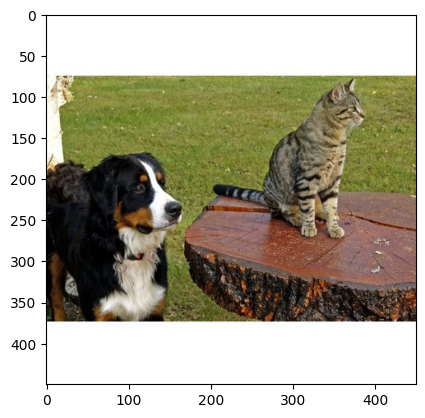

In [115]:
img = get_image('../data/cat_dog.png')
plt.imshow(img)
plt.show()

# LIME

In [116]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                         prediction_function,
                                         # number of labels (with highest prob) to show 
                                         top_labels=5, 
                                         # size of the neighborhood to learn the linear model
                                         num_samples=1000) 

100%|██████████| 1000/1000 [00:21<00:00, 47.38it/s]


In [117]:
explanation.top_labels

[np.int64(240), np.int64(239), np.int64(241), np.int64(238), np.int64(281)]

In [118]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['Appenzeller', 'Bernese mountain dog', 'EntleBucher', 'Greater Swiss Mountain dog', 'tabby, tabby cat']


Overlay the mask on from LIME on the image to see which areas encourage the top prediction

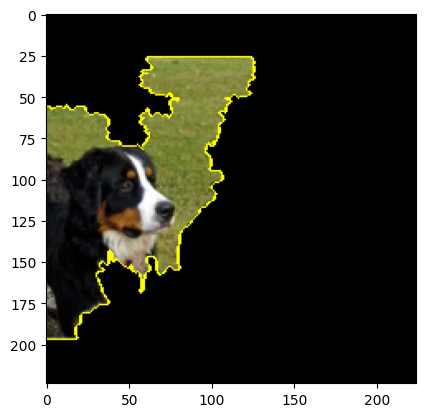

In [119]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show 
                                             num_features=6, 
                                             # turn off the non-explanation part
                                             hide_rest=True)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

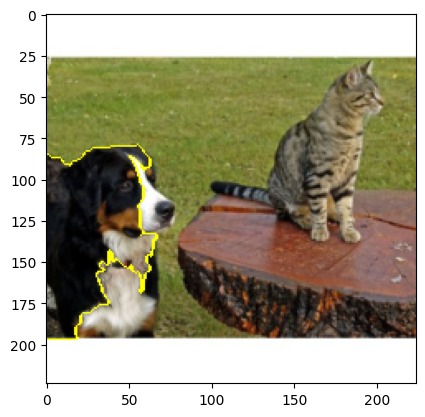

In [120]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show 
                                             num_features=3, 
                                             # turn off the non-explanation part
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

Display areas also areas that contribute against the top prediction.

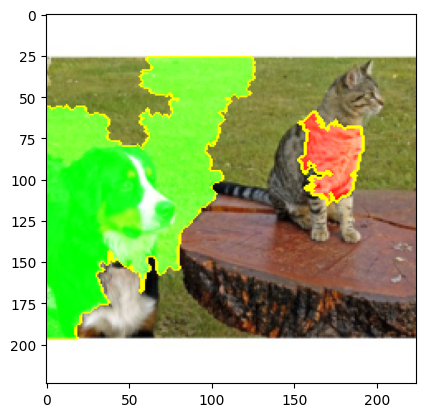

In [121]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                                         positive_only=False,
                                                         negative_only=False,
                                                         num_features=7,
                                                         hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

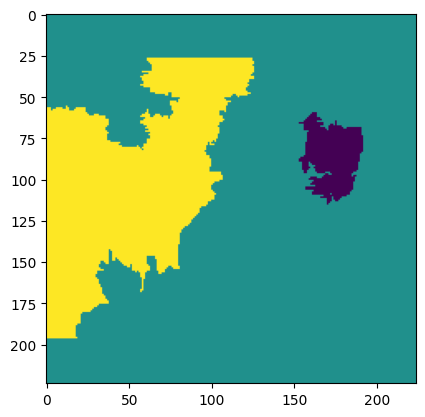

In [122]:
plt.imshow(mask)
plt.show()

In [123]:
np.unique(np.array(mask))

array([-1,  0,  1])

## Other images 

100%|██████████| 1000/1000 [00:20<00:00, 48.58it/s]


['tench, Tinca tinca', 'bolete', 'armadillo', 'isopod', 'mud turtle']


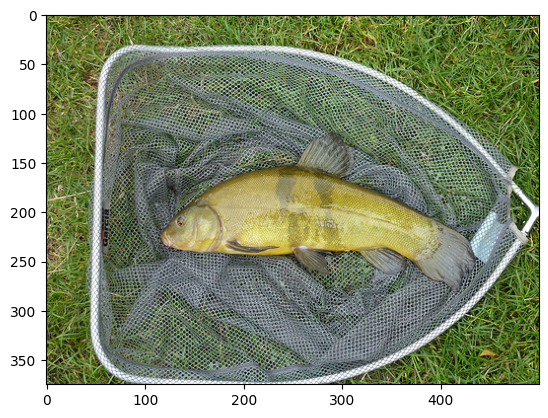

In [124]:
img = get_image('../data/fish.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

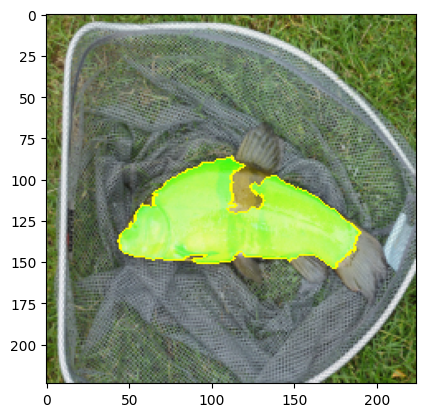

In [125]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], 
                                             positive_only=False, 
                                             num_features=3, 
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

100%|██████████| 1000/1000 [00:21<00:00, 46.16it/s]


['coral reef', 'scuba diver', 'rock beauty, Holocanthus tricolor', 'jellyfish', 'anemone fish']


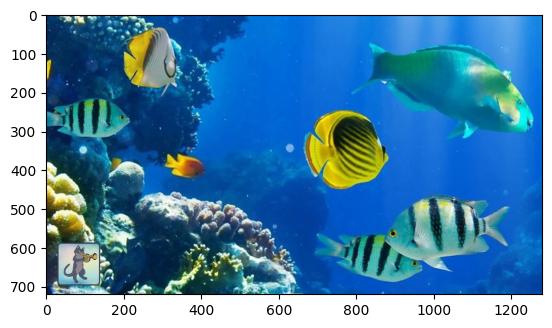

In [126]:
img = get_image('../data/aquarium.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                         prediction_function, 
                                         top_labels=5, 
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

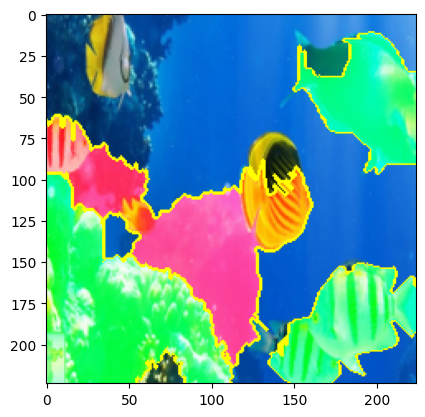

In [127]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], 
                                             positive_only=False, 
                                             num_features=10, 
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

## Your own picture

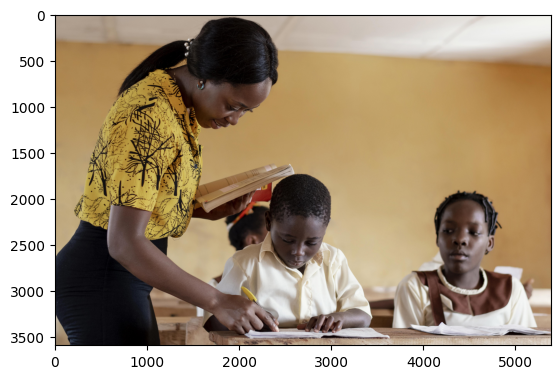

In [136]:
img = get_image('../data/group-african-kids-paying-attention-class.jpg')
plt.imshow(img)
plt.show()

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=5000)

100%|██████████| 5000/5000 [01:52<00:00, 44.36it/s]


In [138]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['vestment', 'marimba, xylophone', "potter's wheel", 'drum, membranophone, tympan', 'Indian cobra, Naja naja']


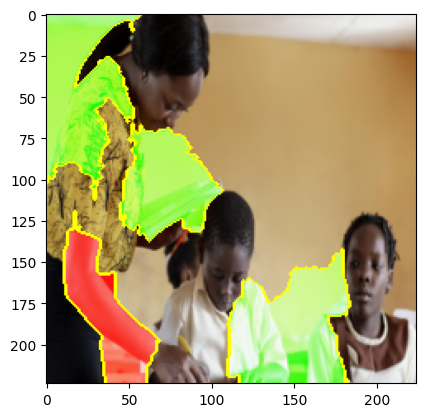

In [139]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], 
                                             positive_only=False, 
                                             num_features=5, 
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=3,
                                         num_samples=7000)

100%|██████████| 5000/5000 [01:45<00:00, 47.32it/s]


In [164]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['vestment', 'marimba, xylophone', "potter's wheel"]


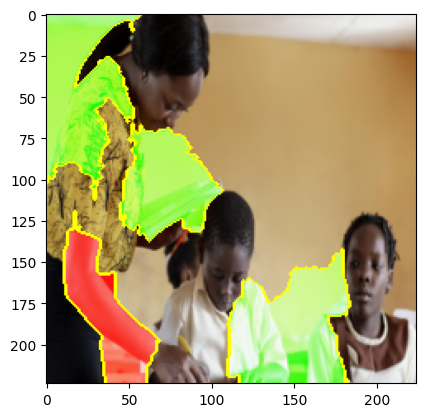

In [165]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], 
                                             positive_only=False, 
                                             num_features=5, 
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

In [203]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns #conda install seaborn
import matplotlib.pyplot as plt
import xgboost
from IPython.display import display, HTML # conda install ipython
from lime.lime_tabular import LimeTabularExplainer
# Depending on conda environment, conda install -c conda-forge lime  OR pip install lime

# Data

#### First, get the .csv file containing the titanic data from https://calmcode.io/static/data/titanic.csv

In [204]:
df = pd.read_csv('../data/titanic_data.csv')
df = df[["pclass","sex","age","survived"]]
df.dropna(inplace=True)

features = df.columns

# Column sex is type string. Encode it to numerical
mapping = {"female": 0, "male": 1}
df["sex"] = df["sex"].map(mapping)

# Train test split
X_data = df[['pclass', 'sex', 'age']].values
y_data = df['survived'].values
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.3)

# Models

In [205]:
def accuracy(true_values, predictions):
    return np.mean(true_values == predictions)

In [206]:
classifier = xgboost.XGBClassifier()
classifier.fit(X_train, y_train)

probs = classifier.predict(X_test)

print("Model accuracy: ", accuracy(y_test, probs))

Model accuracy:  0.8232558139534883


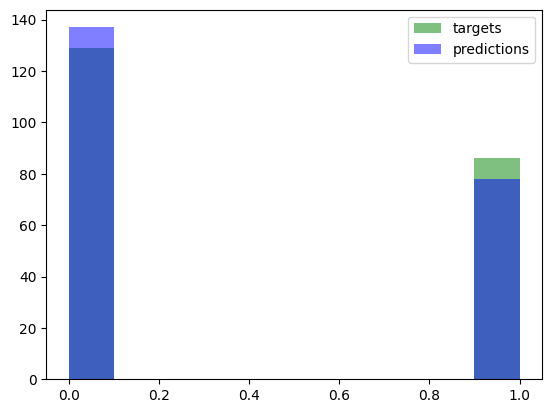

In [207]:
plt.hist(y_test, color="green", alpha=0.5, label="targets")
plt.hist(probs, color="blue", alpha=0.5, label="predictions")
plt.legend()
plt.show()

In [208]:
regressor = xgboost.XGBRegressor(random_state=50)
regressor.fit(X_train, y_train)
probs = regressor.predict(X_test)
classes = [0 if _p<0.5 else 1 for _p in probs]
print("Model accuracy: ", accuracy(y_test, classes))

Model accuracy:  0.7953488372093023


# LIME

In [209]:
# Instantiate explainer objects
lime_regressor = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='regression')

lime_classifier = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='classification')

In [210]:
X_jack = np.array([3,1,21])
X_rose = np.array([1,0,17])

arguments to the explain_instance method:
1) feature values of data point to explain
2) prediction function (of the model to explain)
3) top features to include

In [211]:
exp_lime = lime_classifier.explain_instance(X_jack, classifier.predict_proba, num_features=3)

#exp_lime.show_in_notebook()
# Workaround with same kwargs as show_in_notebook
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.828509936526884
Prediction_local [0.11082493]
Right: 0.102579586


In [212]:
exp_lime = lime_regressor.explain_instance(X_jack, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.8386162956226115
Prediction_local [0.11054953]
Right: 0.13969019


Interpreting the output:


Intercept: the constant in the linear model’s prediction for the test array

Prediction_local: surrogate model prediction, trained on the perturbed samples* using LIME’s top k features

Right: full model prediction for the test array

Visualisations: blue = negative; orange = positive contributions

*obtained by sampling around the test vector following a normal distribution

In [213]:
exp_lime = lime_classifier.explain_instance(X_rose, classifier.predict_proba, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.10752237784642998
Prediction_local [1.06412364]
Right: 0.994662


In [214]:
exp_lime = lime_regressor.explain_instance(X_rose, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.10170441247108841
Prediction_local [1.06463194]
Right: 1.293733


In [215]:
X_kid = np.array([3, 0, 16])
regressor.predict([X_kid])

array([0.5093235], dtype=float32)

In [216]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.35546703499396615
Prediction_local [0.62101001]
Right: 0.5093235


In [217]:
X_kid = np.array([3, 1, 9])
regressor.predict([X_kid])

array([0.6651404], dtype=float32)

In [218]:
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.7935826815081615
Prediction_local [0.21877054]
Right: 0.6651404


# Homework 4:

In [141]:
def calc_shapley_value(player_index, all_players, cf_dict:dict):
    """
    Calculate the Shapley value for player index
    Input:
        all_players, list of player indices
        cf_dict, dictionary containing characteristic function values for all players
    """
    players = all_players.copy()
    if player_index in players:
        players.remove(player_index)

    #TODO
    shapeley_value=0
    sets_by_size = dict()
    for subset in cf_dict.keys():
      sets_by_size[len(subset)] = sets_by_size.get(len(subset),[])+[subset]


    #print("sizes", sets_by_size.keys())
    factorial_N = math.factorial(len(players)+1)
    for size in range(1, len(players)+2):
      coef=math.factorial(size-1)*math.factorial(len(players)+1-size)
      coalition=0
      for subset in sets_by_size[size]:
        if player_index in subset:
          subset_minus_player =list(subset)
          subset_minus_player.remove(player_index)
          coalition += cf_dict[subset]-cf_dict[tuple(subset_minus_player)]
      shapeley_value += coef*coalition
    return shapeley_value/factorial_N

# The Shapley decomposition

# Shapley Value Calculation

## 1. Game Definition
Let the set of players be $N = \{1, 2, 3\}$. The characteristic function $v$ is defined as follows:

| Coalition $S$ | $v(S)$ | Coalition $S$ | $v(S)$ |
| :--- | :--- | :--- | :--- |
| $v(\emptyset)$ | **0** | $v(\{1,2\})$ | **3** |
| $v(\{1\})$ | **2** | $v(\{1,3\})$ | **3** |
| $v(\{2\})$ | **4** | $v(\{2,3\})$ | **2** |
| $v(\{3\})$ | **5** | $v(\{1,2,3\})$ | **3** |

---

## 2. Shapley Formula
The Shapley value for player $i$ is calculated using:
$$\phi_i(v) = \sum_{S \subseteq N \setminus \{i\}} \frac{|S|! (n - |S| - 1)!}{n!} [v(S \cup \{i\}) - v(S)]$$

For a 3-player game ($n=3$), the weights are:
- If $|S|=0$ or $|S|=2$: $\frac{0!2!}{3!} = \frac{2!0!}{3!} = \frac{2}{6} = \frac{1}{3}$
- If $|S|=1$: $\frac{1!1!}{3!} = \frac{1}{6}$

---

## 3. Step-by-Step Calculation

### Player 1
| Subset $S$ | Weight $W$ | Marginal Contribution $[v(S \cup \{i\}) - v(S)]$ | Weighted Contribution |
| :--- | :---: | :--- | :--- |
| $\emptyset$ | $2/6$ | $v(\{1\}) - v(\emptyset) = 2 - 0 = 2$ | $4/6$ |
| $\{2\}$ | $1/6$ | $v(\{1,2\}) - v(\{2\}) = 3 - 4 = -1$ | $-1/6$ |
| $\{3\}$ | $1/6$ | $v(\{1,3\}) - v(\{3\}) = 3 - 5 = -2$ | $-2/6$ |
| $\{2,3\}$ | $2/6$ | $v(\{1,2,3\}) - v(\{2,3\}) = 3 - 2 = 1$ | $2/6$ |

$$\phi_1 = \frac{4 - 1 - 2 + 2}{6} = \frac{3}{6} = \mathbf{0.5}$$

---

### Player 2
| Subset $S$ | Weight $W$ | Marginal Contribution $[v(S \cup \{i\}) - v(S)]$ | Weighted Contribution |
| :--- | :---: | :--- | :--- |
| $\emptyset$ | $2/6$ | $v(\{2\}) - v(\emptyset) = 4 - 0 = 4$ | $8/6$ |
| $\{1\}$ | $1/6$ | $v(\{1,2\}) - v(\{1\}) = 3 - 2 = 1$ | $1/6$ |
| $\{3\}$ | $1/6$ | $v(\{2,3\}) - v(\{3\}) = 2 - 5 = -3$ | $-3/6$ |
| $\{1,3\}$ | $2/6$ | $v(\{1,2,3\}) - v(\{1,3\}) = 3 - 3 = 0$ | $0$ |

$$\phi_2 = \frac{8 + 1 - 3 + 0}{6} = \frac{6}{6} = \mathbf{1.0}$$

---

### Player 3
| Subset $S$ | Weight $W$ | Marginal Contribution $[v(S \cup \{i\}) - v(S)]$ | Weighted Contribution |
| :--- | :---: | :--- | :--- |
| $\emptyset$ | $2/6$ | $v(\{3\}) - v(\emptyset) = 5 - 0 = 5$ | $10/6$ |
| $\{1\}$ | $1/6$ | $v(\{1,3\}) - v(\{1\}) = 3 - 2 = 1$ | $1/6$ |
| $\{2\}$ | $1/6$ | $v(\{2,3\}) - v(\{2\}) = 2 - 4 = -2$ | $-2/6$ |
| $\{1,2\}$ | $2/6$ | $v(\{1,2,3\}) - v(\{1,2\}) = 3 - 3 = 0$ | $0$ |

$$\phi_3 = \frac{10 + 1 - 2 + 0}{6} = \frac{9}{6} = \mathbf{1.5}$$

---

## 4. Summary and Validation
According to the **Efficiency Axiom**, the sum of the Shapley values must equal the value of the grand coalition $v(N)$.

- **Sum of values:** $\sum \phi_i = 0.5 + 1.0 + 1.5 = \mathbf{3.0}$
- **Grand Coalition $v(1,2,3)$:** $\mathbf{3.0}$

**Conclusion:** The sum matches the total value, confirming the distribution is accurate.

### Cab sharing 1

In [142]:
players = [1,2,3]
cf_dict = {():0, (1,):3, (2,):7, (3,):10, 
           (1,2):7, (1,3):10, (2,3):10, 
           (1,2,3):10}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

1.0
3.0
6.0


### Cab sharing 2

In [143]:
players = [1,2,3,4]
cf_dict = {():0, (1,):0, (2,):3, (3,):3, (4,):7, 
           (1,2):3, (1,3):3, (1,4):7, (2,3):3, (2,4):7, (3,4):7, 
           (1,2,3):3, (1,2,4):7, (1,3,4):7, (2,3,4):7, 
           (1,2,3,4):7}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))
print(calc_shapley_value(4, players, cf_dict))

0.0
1.0
1.0
5.0


### Cat and mice

In [144]:
players = [1,2,3]
cf_dict = {():0, (1,):2, (2,):4, (3,):5, (1,2):3, (1,3):3, (2,3):2, (1,2,3):3}
print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

0.5
1.0
1.5


# From game theory to machine learning

## Data and correlation

In [145]:
X_data, y_data = load_diabetes(scaled=True, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

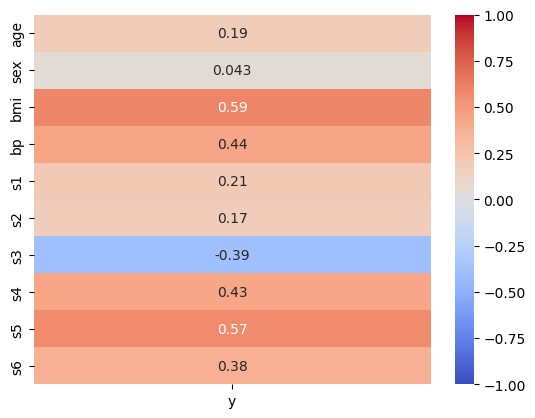

In [146]:
df = pd.concat([X_data, y_data.rename("y")], axis=1)
corr = df.corr(numeric_only=True)
sns.heatmap(corr.loc[X_data.columns, ["y"]], annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

## The Shapley value for the target, using as characteristic function the linear correlation R²

In [147]:
def calc_shapley_values(x, cf_dict):
    """
    Returns the shapley values for features x, given a
    dictionary cf_dict containing the characteristic function values. 
    """
    
    players = list(range(x.shape[1]))
    shapley_values = []
    for _player in players:
        shapley_values.append(calc_shapley_value(_player, players, cf_dict))
    return shapley_values

def sort_shapley_values(values, features):
    return zip(*sorted(zip(values, features), reverse=True))

def flatten(tup):
    """ 
    Flatten any nested tuple
    """
    if len(tup) < 1:
        return tup 
    if isinstance(tup[0], tuple):
        return flatten(tup[0]) + flatten(tup[1:])
    return tup[:1] + flatten(tup[1:])

def make_cf_dict(x, y, characteristic_function):
    """ 
    Creates dictionary with values of the characteristic function for each
    combination of the players.
    """
    cf_dict = {}
    num_players = x.shape[1]
    players = list(range(num_players))
    coalition_sizes = list(range(num_players+1))

    for _size in coalition_sizes:
        coalitions_of_size_s = list(combinations(players, _size))
        for _coalition in coalitions_of_size_s:
            _coalition = tuple(sorted(flatten(_coalition)))
            cf_dict[_coalition] = characteristic_function(x, y, _coalition)

    return cf_dict

def characteristic_function_r2(x, y, coalition):
    """
    Returns the coefficient of determination between the indices of x indicated in coalition and y
    Input:
        x, numpy array shape (#samples, #features)        
        y, numpy array shape (#samples, )
        coalition, tuple of indices of features to include
    """
    if len(coalition)==0:
        return 0.0
    x = x[:, coalition]
    
    # --- Coefficient of determination, R2
    det_C_xy = np.linalg.det(np.corrcoef(x.T, y))
    if len(coalition)==1:
        det_C_x = 1
    else:
        det_C_x = np.linalg.det(np.corrcoef(x.T))

    return (1 - det_C_xy/det_C_x)

In [148]:
cf_dict_R2 = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_r2)
print(len(cf_dict_R2))
print(2**len(features))

1024
1024


In [149]:
shapley_values = calc_shapley_values(X_data.to_numpy(), cf_dict_R2)

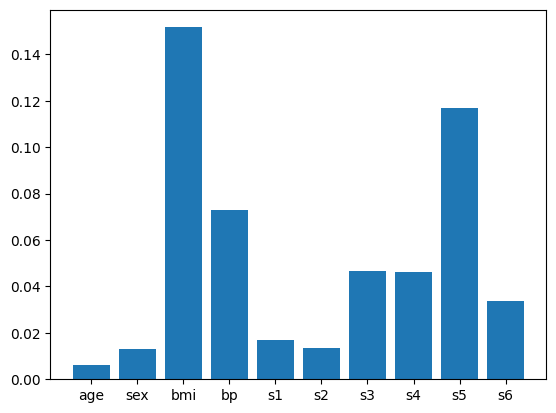

In [150]:
plt.bar(range(len(shapley_values)), shapley_values)
plt.xticks(range(len(shapley_values)), features)
plt.show()

In [151]:
print("Sum of the Shapley values: ", sum(shapley_values))
print("Value of the grand coalition: ", cf_dict_R2[list(cf_dict_R2.keys())[-1]])

Sum of the Shapley values:  0.5177484222203488
Value of the grand coalition:  0.5177484222203489


## The Shapley value for the target, using as characteristic function the distance correlation

In [152]:
def characteristic_function_dcor(x, y, coalition):
    if len(coalition)==0:
        return 0.0

    x = x[:, coalition]
    
    return dcor.distance_correlation(x,y)

In [153]:
cf_dict_dcor = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_dcor)
shapley_values_dcor = calc_shapley_values(X_data, cf_dict_dcor)

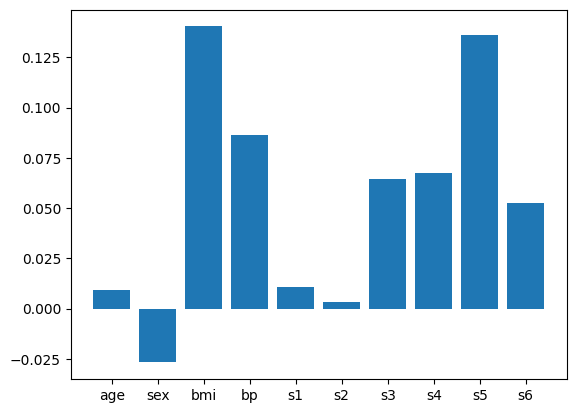

In [154]:
plt.bar(range(len(shapley_values_dcor)), shapley_values_dcor)
plt.xticks(range(len(shapley_values_dcor)), features)
plt.show()

In [155]:
_, sorted_features = sort_shapley_values(shapley_values, features)
print(sorted_features)
_, sorted_features_dcor = sort_shapley_values(shapley_values_dcor, features)
print(sorted_features_dcor)

('bmi', 's5', 'bp', 's3', 's4', 's6', 's1', 's2', 'sex', 'age')
('bmi', 's5', 'bp', 's4', 's3', 's6', 's1', 'age', 's2', 'sex')


# Shapley values for a model

### Train and evaluate regressor

In [156]:
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

In [157]:
y_pred = regressor.predict(x_test)

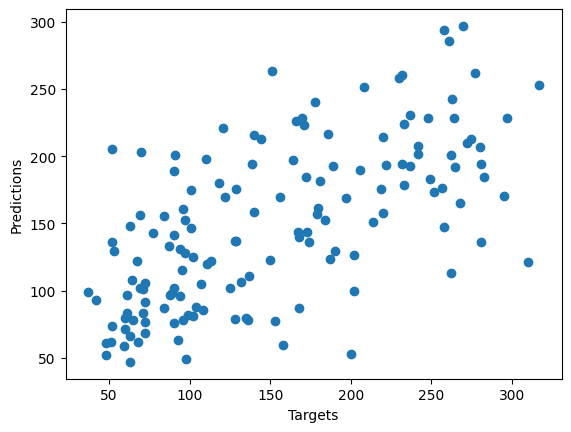

In [158]:
plt.scatter(y_test, y_pred)
plt.xlabel("Targets")
plt.ylabel("Predictions")
plt.show()

### Compare Shapley values for target and predictions

In [159]:
cf_dict_dcor_targets = make_cf_dict(x_test.to_numpy(), y_test.to_numpy(), characteristic_function_dcor)
shapley_values_targets = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_targets)

In [160]:
cf_dict_dcor_preds = make_cf_dict(x_test.to_numpy(), np.array(y_pred), characteristic_function_dcor)
shapley_values_preds = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_preds)

/home/melvin/Documents/Melvin/AIMS_XAI_Inga/XAI/lib/python3.13/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


In [161]:
def plot_shapley_comparison(values_0, values_1,feature_names=None, nametags=[0,1]):
    assert len(values_0) == len(values_1)
    num = range(1,len(values_0)+1)
    colors = ["blue", "pink"]
    
    for _n, _values in enumerate([values_0, values_1]):
        _col = colors[_n]
        plt.scatter(num,_values,c=_col,marker='s',alpha=0.7,label=f"Shapley values {nametags[_n]}")

    plt.ylabel("Shapley values")
    plt.legend()
    if feature_names is not None:
        ax = plt.gca()
        ax.set_xticks(num)
        ax.set_xticklabels(feature_names,rotation=45)
    plt.show()

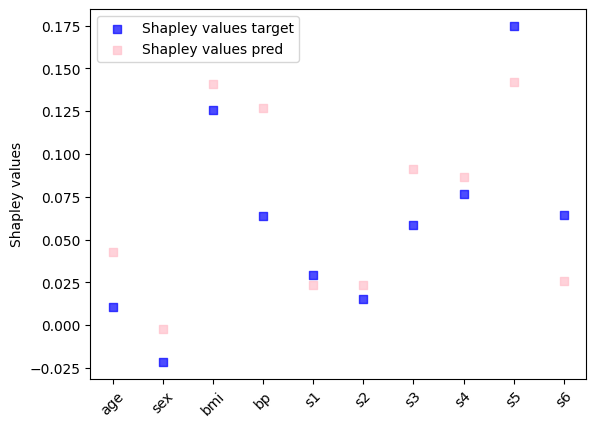

In [162]:
plot_shapley_comparison(shapley_values_targets, shapley_values_preds, features, ["target", "pred"])

# Homework 5:

# Tabular data

## Data and model

In the diabetes dataset, each y value reflects how much a patient’s condition progressed after a year

In [63]:
X_data, y_data = load_diabetes(scaled=False, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

In [64]:
# I also love np arrays, but keep the dataframe structure if you want feature names on your SHAP plot
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

In [65]:
regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

## SHAP explainer and plot

Initialise explainer on the model, and (for now) specify a background data set.
This causes SHAP to estimate the expectation by marginalising missing features independently (using the background data), thus breaking empirical feature correlations

In [66]:
explainer = shap.TreeExplainer(regressor, data=x_train)
shap_values = explainer.shap_values(x_test)

First, make the typical SHAP plot. 
Remember from yesterday's Shapley values that bmi was important, while age was (up to third) least important

/tmp/ipykernel_12256/1293072184.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, x_test, plot_type="violin")


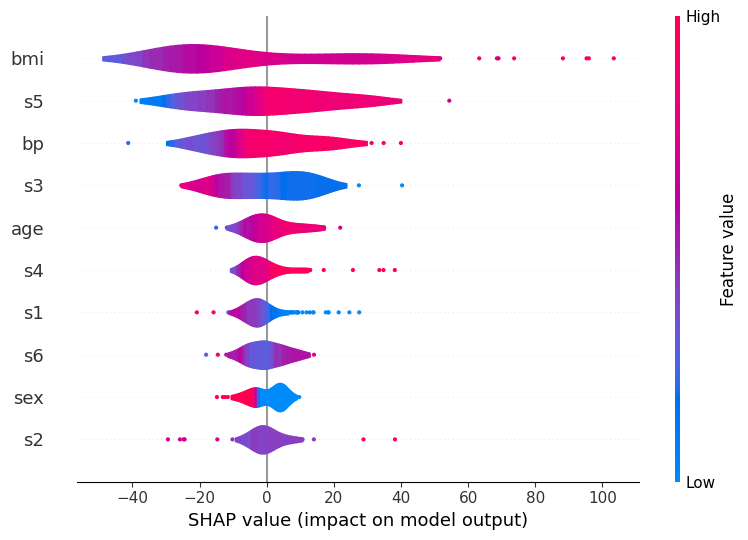

In [67]:
shap.summary_plot(shap_values, x_test, plot_type="violin")

Let's look closer at a single instance and use SHAP to explain the prediction

In [68]:
y_pred = regressor.predict(x_test)
index = 2
print("Mean BMI in test data:", np.mean(x_test.bmi))
print("Mean prediction on test data:", np.mean(y_pred))
print("Prediction on our data point:", y_pred[index])
print("Data point:")
print(x_test.iloc[index])

shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

Mean BMI in test data: 26.043150684931508
Mean prediction on test data: 149.2698
Prediction on our data point: 126.554016
Data point:
age     66.0000
sex      2.0000
bmi     26.0000
bp      91.0000
s1     264.0000
s2     146.6000
s3      65.0000
s4       4.0000
s5       5.5683
s6      87.0000
Name: 72, dtype: float64


In [69]:
print(explainer.expected_value)
print(sum(shap_values[index, :]))
print(regressor.predict(x_test)[index])
print(explainer.expected_value + sum(shap_values[index, :]))

154.44574596805717
-27.891726560560564
126.554016
126.55401940749661


In [70]:
print("Base value + sum of the SHAP values=", explainer.expected_value + sum(shap_values[index,:]))

Base value + sum of the SHAP values= 126.55401940749661


Remember that the base value represents the expected model prediction without any feature values, so the mean prediction on the background data (in our case the training data). Check if this is the case:

In [71]:
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
mean_y = y_train.mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 154.44574596805717 
Mean prediction on training data: 151.98286


The two values are not exactly equal because the base value is estimated assuming feature independence.

If we instead let SHAP use the tree to estimate this value, it aligns more closely with the actual prediction on the test data.

In [72]:
explainer = shap.TreeExplainer(regressor, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(x_test)
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 151.98288 
Mean prediction on training data: 151.98286


# MNIST

In [73]:
batch_size = 64

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=True,
        download=True,
        transform=transforms.Compose([transforms.ToTensor()]),
    ),
    batch_size=batch_size,
    shuffle=True,
)

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data", 
        train=False, 
        transform=transforms.Compose([transforms.ToTensor()])),
    batch_size=batch_size,
    shuffle=True,
)

100%|██████████| 9.91M/9.91M [00:12<00:00, 819kB/s] 
100%|██████████| 28.9k/28.9k [00:00<00:00, 108kB/s]
100%|██████████| 1.65M/1.65M [00:03<00:00, 432kB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 3.60MB/s]


B (Batch size): 64,

C (Channels): 1,

H (Height): 28,

W (Width): 28

In [74]:
# This cell is just for understanding the data loader objects
imgs, lbls = next(iter(test_loader))
print(imgs.shape)  # torch.Size([B, C, H, W])
print(lbls.shape)  # torch.Size([B])

torch.Size([64, 1, 28, 28])
torch.Size([64])


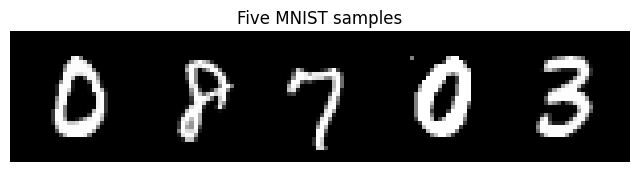

In [75]:
# This cell is just for looking at some of the images
from torchvision.utils import make_grid
imgs5 = imgs[:5]

# Make a grid and plot
grid = make_grid(imgs5, nrow=5, padding=2)
plt.figure(figsize=(8, 2))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
plt.axis("off")
plt.title("Five MNIST samples")
plt.show()

### Train/load and test a simple pytorch model

In [76]:
num_epochs = 5
device = torch.device("cpu")

class Net(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.Dropout(),
            nn.MaxPool2d(2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.Softmax(dim=1),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(-1, 320)
        x = self.fc_layers(x)
        return x


def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output.log(), target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print(
                f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}"
                f" ({100.0 * batch_idx / len(train_loader):.0f}%)]"
                f"\tLoss: {loss.item():.6f}"
            )


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output.log(), target).item()  # sum up batch loss
            pred = output.max(1, keepdim=True)[1]  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(
        f"\nTest set: Average loss: {test_loss:.4f},"
        f" Accuracy: {correct}/{len(test_loader.dataset)}"
        f" ({100.0 * correct / len(test_loader.dataset):.0f}%)\n"
    )

model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

model_file = "mnist_cnn.pt"

if os.path.isfile(model_file):
    print(f"Found model file {model_file}. Loading...")
    state = torch.load(model_file, map_location=device, weights_only=True)
    model.load_state_dict(state, strict=True)
    test(model, device, test_loader)

else:
    print(f"Found no model saved as {model_file}. Training...")
    for epoch in range(1, num_epochs + 1):
        train(model, device, train_loader, optimizer, epoch)
        torch.save(model.state_dict(), model_file)
        test(model, device, test_loader)


Found no model saved as mnist_cnn.pt. Training...
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.319800
Train Epoch: 1 [6400/60000 (11%)]	Loss: 2.226525
Train Epoch: 1 [12800/60000 (21%)]	Loss: 1.404323
Train Epoch: 1 [19200/60000 (32%)]	Loss: 0.839380
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.815710
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.630596
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.695490
Train Epoch: 1 [44800/60000 (75%)]	Loss: 0.550334
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.542966
Train Epoch: 1 [57600/60000 (96%)]	Loss: 0.366095

Test set: Average loss: 0.0047, Accuracy: 9370/10000 (94%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.437179
Train Epoch: 2 [6400/60000 (11%)]	Loss: 0.310109
Train Epoch: 2 [12800/60000 (21%)]	Loss: 0.402220
Train Epoch: 2 [19200/60000 (32%)]	Loss: 0.492784
Train Epoch: 2 [25600/60000 (43%)]	Loss: 0.266507
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.469800
Train Epoch: 2 [38400/60000 (64%)]	Loss: 0.436402
Train Epoch: 2 [44800/60000 (75%)]	Loss: 0.602329
T

Use the model to predict on test data

Label: 8
Prediction: 8
Probabilities: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


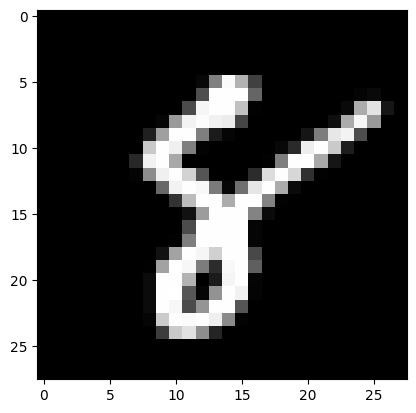

In [77]:
index = 2
model.eval()
with torch.no_grad():
    images, labels = next(iter(test_loader))
    x = images[index-1:index].to(device)
    y = labels[index-1].to(device)

    output = model(x)
    pred = output.argmax(dim=1).item()

print("Label:", y.item())
print("Prediction:", pred)
print(f"Probabilities: {np.round(output.numpy()[0],2)}")

plt.imshow(x.squeeze(), cmap="gray")
plt.show()

### SHAP

Build a small background set (reference distribution)

In [78]:
# Use ~50–200 images to keep it fast
background, _ = next(iter(train_loader))
background = background[:50].to(device)   # [50, 1, 28, 28]
background.shape

torch.Size([50, 1, 28, 28])

 Create the explainer

In [79]:
explainer = shap.DeepExplainer(model, background)

Pick a few samples to explain

In [80]:
test_samples, test_labels = next(iter(test_loader))
N = test_samples.size(0)
idx = torch.randperm(N)[:5]
test_samples = test_samples[idx]          # [5, 1, 28, 28]
test_labels = test_labels[idx]
test_samples.shape

torch.Size([5, 1, 28, 28])

Compute SHAP values

Returns a list with one array per data point: shap_values[data_index].shape == [1, 28, 28, 10]

In [81]:
shap_values = explainer.shap_values(test_samples)
shap_values[0].shape

(1, 28, 28, 10)

For the plot, we call image_plot(shap_values, pixel_values). This function needs input as:

shap_values: [numpy.array:]:
    List of numpy arrays of SHAP values. Each array has the shape [samples, W, H, C], and length equal to the number of model outputs.

pixel_values: numpy.array:
    Matrix of pixel values [samples, W, H, C] for each image. It should be the same shape as each array in the shap_values list of arrays.

In [82]:
shap_numpy = list(np.transpose(shap_values, (4, 0, 2, 3, 1)))
test_numpy = np.swapaxes(np.swapaxes(test_samples.numpy(), 1, -1), 1, 2)
print(len(shap_numpy))     # 10
print(shap_numpy[0].shape) # (5, 28, 28, 1)
print(test_numpy.shape)    # (5, 28, 28, 1)

10
(5, 28, 28, 1)
(5, 28, 28, 1)


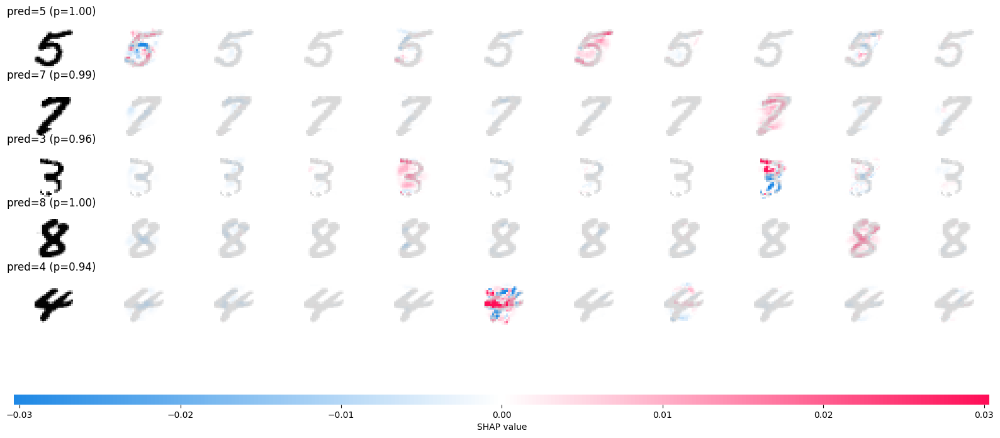

In [83]:
probs = model(test_samples).detach().numpy()      # [N,10]
pred_cls = probs.argmax(axis=1)
row_labels = [f"pred={int(pred_cls[i])} (p={probs[i, pred_cls[i]]:.2f})" for i in range(len(pred_cls))]

shap.image_plot(shap_numpy, -test_numpy, true_labels=row_labels)

The shape of the explainer.expected value corresponds to the number of classes. There is one expected prediction = baseline per class

In [84]:
explainer.expected_value

array([0.22129714, 0.1823757 , 0.02434198, 0.09310412, 0.11143775,
       0.07883472, 0.0397653 , 0.07896221, 0.11204287, 0.05783816],
      dtype=float32)

In [85]:
sum(explainer.expected_value)

np.float32(0.9999999)